# Import Dependencies

In [1]:
%pip install cdlib scikit-learn pandas plotly hvplot community python-louvain dynetx seaborn
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('./lib')

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
from visualization import visualize_disconnected_communities, visualize_hierarchical_communities 
from utils import modified_rand_score, evaluate_level1_communities, evaluate_level2_communities, format_results, generate_missing_row

import networkx as nx
import dynetx as dn

from cdlib import algorithms, evaluation
import csv
import numpy as np
import pandas as pd
import os
import seaborn as sns

from sklearn.metrics import rand_score
from sklearn.metrics import adjusted_rand_score


from scipy.stats import spearmanr
from scipy.stats import kendalltau
from scipy.spatial import distance

from networkx.algorithms import approximation
from networkx.algorithms.community.quality import modularity
from networkx.algorithms.centrality import closeness_centrality
from cdlib import NodeClustering
from matplotlib.patches import FancyArrowPatch

import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches

from sklearn.metrics import pair_confusion_matrix
import matplotlib.colors as mcolors
from matplotlib.patches import Patch

import colorsys
import random

Note: to be able to use all crisp methods, you need to install some additional packages:  {'graph_tool', 'bayanpy', 'infomap', 'wurlitzer', 'leidenalg'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'ASLPAw', 'pyclustering'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'wurlitzer', 'leidenalg', 'infomap'}


# Level 1 Network Formation

We experiment with varying levels of delta, from (0.15, 0.5, 0.85).

In [3]:
# Load the dataset
file_path = "../dataset/cho-384/cho-384.txt"
df = pd.read_csv(file_path, sep="\t")

level_2_df = pd.read_csv("../dataset/cho-170/cho-170.txt", sep="\t")

# Create a mapping of Gene to Level_2
gene_to_level_2 = dict(zip(level_2_df["Gene"], level_2_df["Level_2"]))

# Extract relevant columns
genes = df["Gene"]
level_1_classes = df["Level_1"]
expression_data = df.iloc[:, 2:].values  # Extract time-series expression data

# Compute Pearson correlation matrix
correlation_matrix = np.corrcoef(expression_data)

# Threshold for value-based graph construction
delta_values = np.arange(0.1, 1, 0.05)

# Initialize array to store results for each delta value
results = []

for delta in delta_values:
    threshold = delta
    adjacency_matrix = (correlation_matrix >= threshold ).astype(int)

    # Create a graph
    G = nx.Graph()

    # Add nodes with Level 1 classification as attributes
    for idx, gene in enumerate(genes):
        level_2_class = gene_to_level_2.get(gene, None) # Get Level_2 if it exists, otherwise None
        G.add_node(idx, level_1=level_1_classes[idx], level_2=level_2_class)

    # Add edges based on Pearson correlation threshold
    edges = []
    for i in range(len(genes)):
        for j in range(i + 1, len(genes)):
            if adjacency_matrix[i, j] == 1:
                G.add_edge(i, j, weight=correlation_matrix[i, j])


    # Remove singletons
    singletons = list(nx.isolates(G))
    G.remove_nodes_from(singletons)

    # Compute additional graph properties
    avg_degree = sum(dict(G.degree()).values()) / len(G.nodes())  # Average degree
    density = nx.density(G)  # Graph density
    avg_clustering = nx.average_clustering(G)  # Average clustering coefficient
    largest_cc = max(nx.connected_components(G), key=len)  # Largest connected component
    largest_cc_size = len(largest_cc)  # Size of the largest component
    diameter = nx.diameter(G.subgraph(largest_cc)) if nx.is_connected(G) else None  # Diameter

    # get density of largest connected component
    largest_cc_graph = G.subgraph(largest_cc)
    largest_cc_density = nx.density(largest_cc_graph) if len(largest_cc_graph.nodes()) > 0 else 0
    # print(f"Delta: {delta}, Largest CC Density: {largest_cc_density}")
    # Store results for the current delta, including the graph
    connected_components_sizes = [len(cc) for cc in nx.connected_components(G)]
    results.append({
        "Delta": delta,
        "Graph": G,  # Store the graph object
        "Number of Nodes": len(G.nodes()),
        "Number of Edges": G.number_of_edges(),
        "Transitivity": nx.transitivity(G) if len(G.nodes()) > 0 else 0,
        "Singletons Removed": len(singletons),
        "Average Degree": avg_degree,
        "Density of Largest CC": largest_cc_density,
        "Average Clustering Coefficient": avg_clustering,
        "Largest Component Size": largest_cc_size,
        "Diameter (if connected)": diameter,
        "Connected Component Sizes": connected_components_sizes
    })

# Convert results to a DataFrame for visualization (excluding the graph object)
graph_properties = pd.DataFrame([{k: v for k, v in result.items() if k != "Graph"} for result in results])

output_dir = "../results/cho-384"
if not os.path.exists(output_dir):
	os.makedirs(output_dir)

# Save graph properties to a CSV file
graph_properties.to_csv(f"{output_dir}/graph_properties.csv", index=False)
graph_properties

,Delta,Number of Nodes,Number of Edges,Transitivity,Singletons Removed,Average Degree,Density of Largest CC,Average Clustering Coefficient,Largest Component Size,Diameter (if connected),Connected Component Sizes
0,0.10,384,33695,0.760440,0,175.494792,0.458211,0.749597,384,3.0,[384]
1,0.15,384,31622,0.763279,0,164.697917,0.430021,0.750456,384,3.0,[384]
2,0.20,384,29611,0.766537,0,154.223958,0.402674,0.751598,384,3.0,[384]
3,0.25,384,27690,0.769617,0,144.218750,0.376550,0.751233,384,3.0,[384]
4,0.30,384,25760,0.775733,0,134.166667,0.350305,0.752632,384,3.0,[384]
5,0.35,384,23918,0.779619,0,124.572917,0.325256,0.751186,384,4.0,[384]
6,0.40,384,22069,0.784625,0,114.942708,0.300112,0.749807,384,4.0,[384]
7,0.45,384,20131,0.789246,0,104.848958,0.273757,0.745790,384,4.0,[384]
8,0.50,384,18217,0.789861,0,94.880208,0.247729,0.739437,384,5.0,[384]
9,0.55,383,16247,0.786742,1,84.840731,0.222096,0.726502,383,6.0,[383]


# Level 1 Network Visualization

We color the nodes in the network based on their Level 1 Classification.

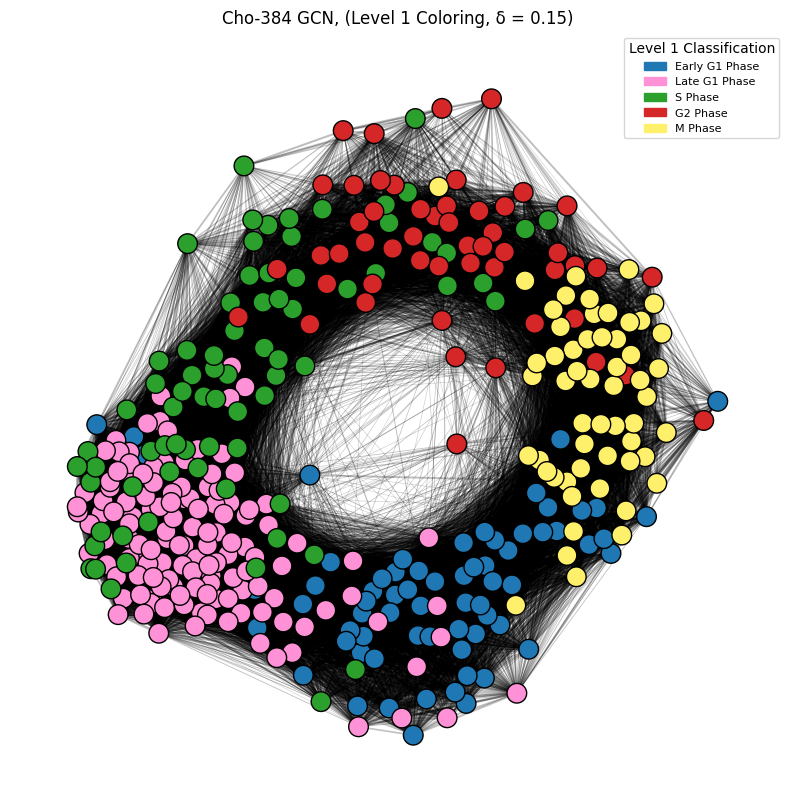

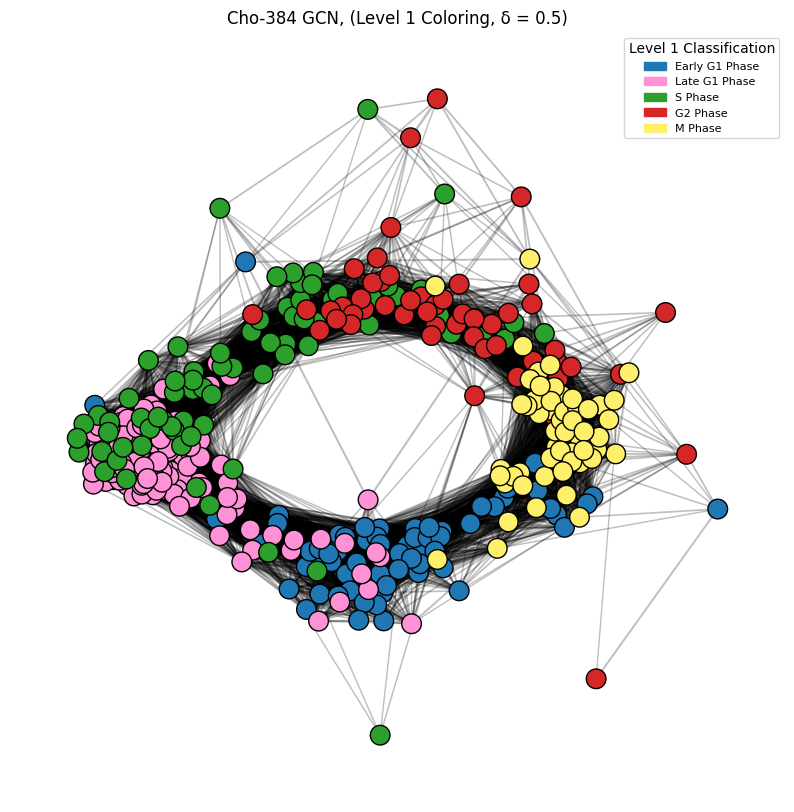

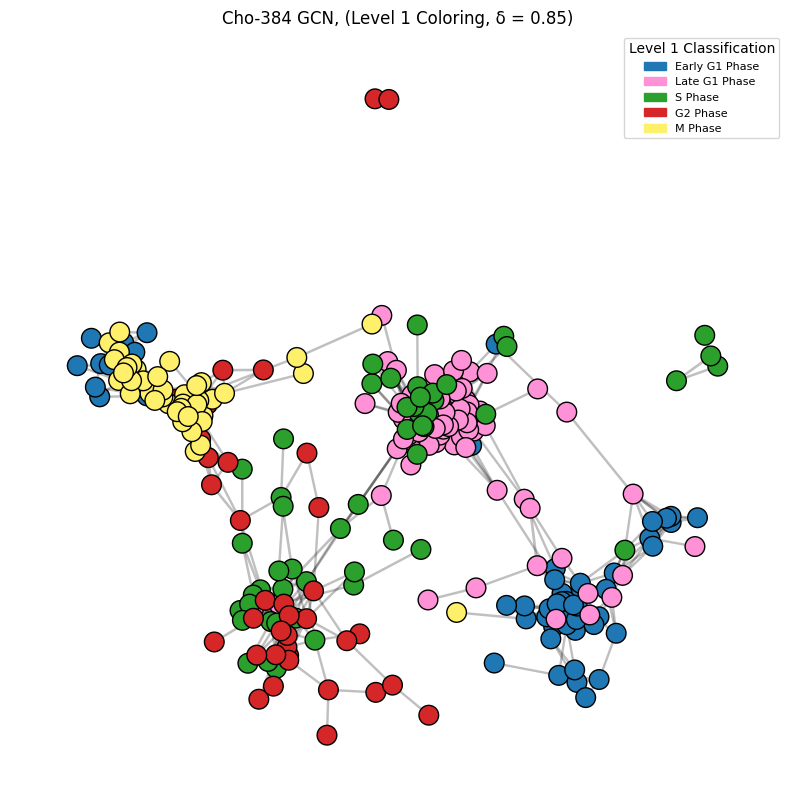

In [9]:
TABLEAU_COLORS = {
    'tab:blue': '#1f77b4',
    'tab:pink': '#ff91d7',
    'tab:green': '#2ca02c',
    'tab:red': '#d62728',
    'tab:yellow': '#fff06b',
}
# Define unique colors for each Level 1 classification
unique_classes = level_1_classes.unique()
color_map = {cls: TABLEAU_COLORS[list(TABLEAU_COLORS.keys())[i]] for i, cls in enumerate(unique_classes)}

G_015 = results[1]["Graph"]  # Choose the graph with delta = 0.15
G_05 = results[8]["Graph"]  # Choose the graph with delta = 0.5
G_085 = results[15]["Graph"]  # Choose the graph with delta = 0.85
graphs = [G_015, G_05, G_085]

for G, delta_value in zip(graphs, [0.15, 0.50, 0.85]):
	# Assign colors to nodes based on Level 1 classification
	node_colors = [color_map[G.nodes[n]["level_1"]] for n in G.nodes()]

	# Edge weights for visualization (stronger edges appear tighter)
	edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

	# Generate graph layout
	plt.figure(figsize=(10, 10))
	cell_cycle_phases = ["Early G1 Phase", "Late G1 Phase", "S Phase", "G2 Phase", "M Phase"]
	legend_handles = [Patch(color=color, label=f'{cell_cycle_phases[cls-1]}') for cls, color in color_map.items()]
	plt.legend(handles=legend_handles, loc="best", fontsize=8, title="Level 1 Classification")
	pos = nx.spring_layout(G, weight='weight', k=0.1, seed=10)  # Spring layout based on weights

	# Draw nodes
	nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=200, alpha=1, edgecolors="black")

	# Draw edges with thickness based on weight
	nx.draw_networkx_edges(G, pos, alpha=0.25, edge_color="black", width=[w * 2 for w in edge_weights])

	# Show plot
	plt.title(f"Cho-384 GCN, (Level 1 Coloring, δ = {delta_value})")
	plt.axis("off")
	plt.savefig(f"{output_dir}/visualization/cho_384_gcn_L1_{delta_value}.png", dpi=300, bbox_inches='tight')
	plt.show()

# Level 2 Network Visualization
For this section, nodes/genes in the dataset that do not have a Level 2 classification will be colored gray. Varying hues of the same color indicate finer classification under the same Level 1 classification.

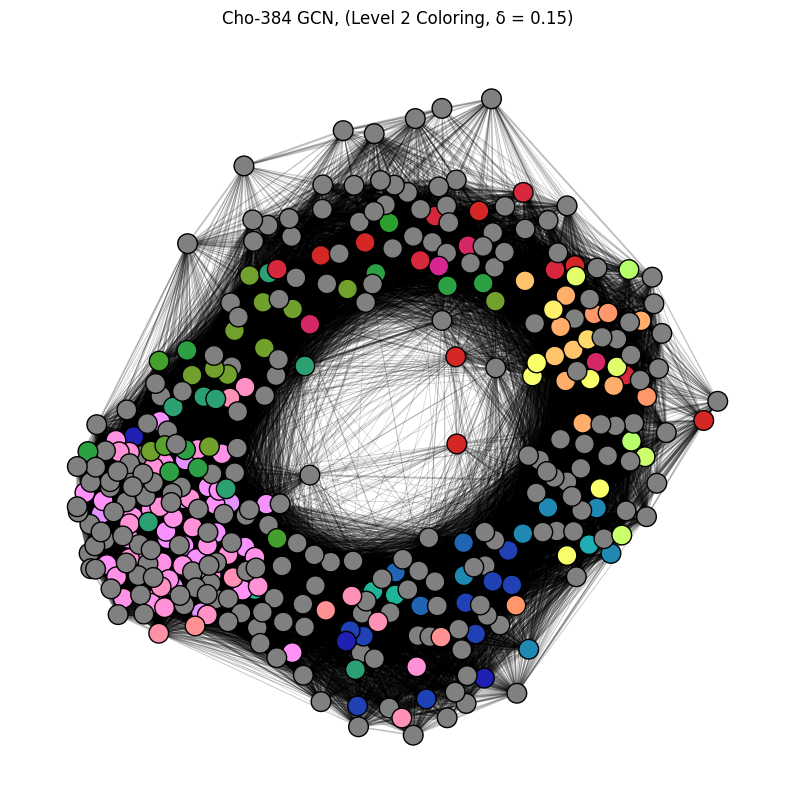

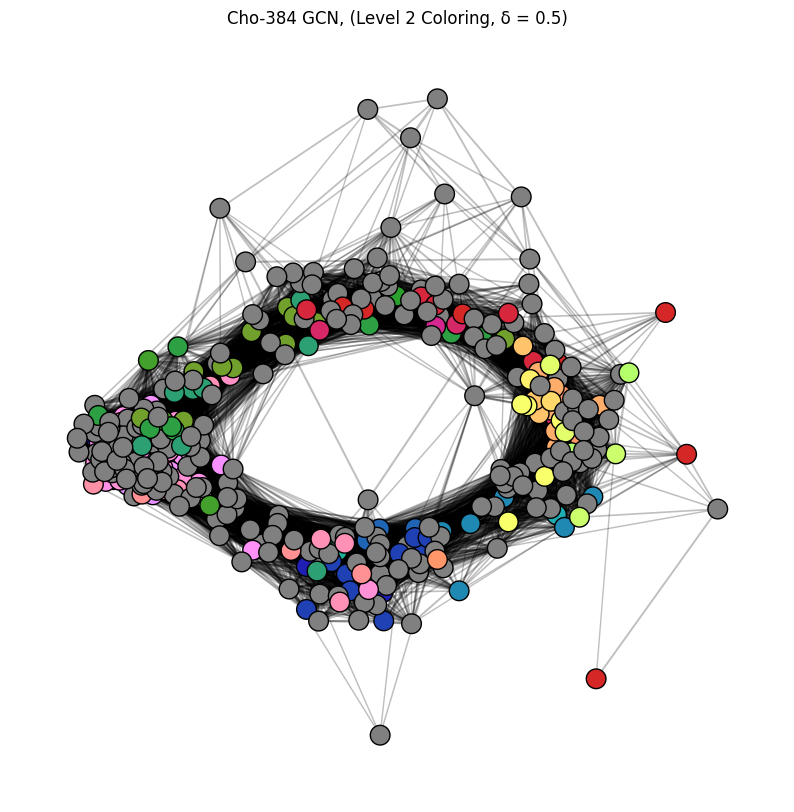

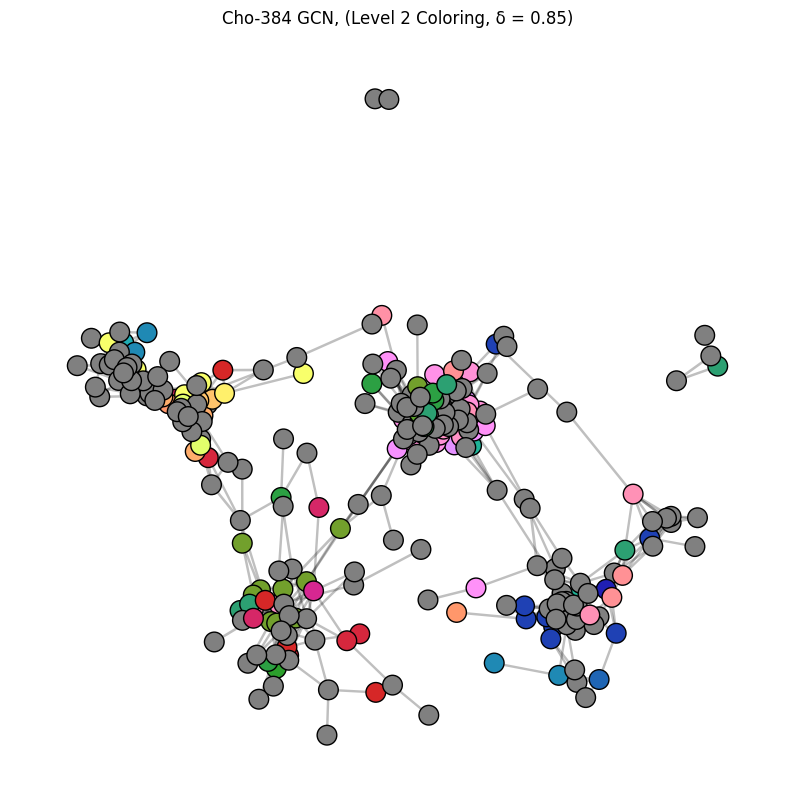

In [10]:
base_colors = {cls: TABLEAU_COLORS[list(TABLEAU_COLORS.keys())[i]]
               for i, cls in enumerate(unique_classes)}

# Function to generate distinct but related colors for Level 2 classifications
def generate_hue_variations(base_color, num_shades):
    """Generate distinct hues within a color family using HSL space."""
    base_rgb = mcolors.to_rgb(base_color)
    base_hls = colorsys.rgb_to_hls(*base_rgb)
    
    # Create variations by adjusting only the HUE component
    hues = np.linspace(base_hls[0] - 0.1, base_hls[0] + 0.1, num_shades)
    hues = np.clip(hues, 0, 1)  # Ensure hues are within valid range
    
    return [mcolors.to_hex(colorsys.hls_to_rgb(hue, base_hls[1], base_hls[2])) for hue in hues]

# Generate Level 2 colors based on hue variations within the Level 1 color family
level_2_groups = level_2_df.groupby("Level_1")["Level_2"].unique()
level_2_colors = {}

for lvl1, lvl2_values in level_2_groups.items():
    shades = generate_hue_variations(base_colors[lvl1], len(lvl2_values))
    for idx, lvl2 in enumerate(lvl2_values):
        level_2_colors[lvl2] = shades[idx]

for G, delta_value in zip(graphs, [0.15, 0.5, 0.85]):
	# Assign colors to nodes based on Level 2 classification
	node_colors_level_2 = [level_2_colors[G.nodes[n]["level_2"]] if G.nodes[n]["level_2"] in level_2_colors else "#808080" # Gray color
												for n in G.nodes()]

	# Edge weights for visualization
	edge_weights = [G[u][v]['weight'] for u, v in G.edges()]

	# Generate graph layout
	plt.figure(figsize=(10, 10))
	cell_cycle_phases = ["Early G1 Phase", "Late G1 Phase", "S Phase", "G2 Phase", "M Phase"]
	legend_handles_lvl2 = [Patch(color=color, label=f'Level 2: {cls}') for cls, color in level_2_colors.items()]
	# plt.legend(handles=legend_handles_lvl2, loc="best", fontsize=6, title="Classification Hierarchy")

	pos = nx.spring_layout(G, weight='weight', k=0.1, seed=10)

	# Draw nodes
	nx.draw_networkx_nodes(G, pos, node_color=node_colors_level_2, node_size=200, alpha=1, edgecolors="black")

	# Draw edges
	nx.draw_networkx_edges(G, pos, alpha=0.25, edge_color="black", width=[w * 2 for w in edge_weights])

	# Show plot
	plt.title(f"Cho-384 GCN, (Level 2 Coloring, δ = {delta_value})")
	plt.axis("off")
	plt.savefig(f"{output_dir}/visualization/cho_384_gcn_L2_{delta_value}.png", dpi=300, bbox_inches='tight')
	plt.show()


# Community Detection Auxiliary Functions

These are the functions used during the Community Detection of our constructed network.

In [83]:
# Need to have a special function for Paris, since we need to relabel nodes so it doesnt conflict
# with the built in functions in cdlib (it does not support int node labels)
def apply_paris(G):
    G_for_paris = nx.relabel_nodes(G, lambda x: f"n{x}", copy=True)
    paris_communities = algorithms.paris(G_for_paris)

    original_labels = list(G.nodes())
    label_map = {f"n{node}": node for node in original_labels}

    remapped_communities = [
        [int(n[1:]) for n in community]
        for community in paris_communities.communities
    ]

    paris_communities_fixed = NodeClustering(
        communities=remapped_communities,
        graph=G,
        method_name="Paris"
    )
    return paris_communities_fixed


def extract_second_level_communities(G, cd_algorithm, top_level_clustering: NodeClustering, method_name: str, alpha = None, level = 5):
    ordered_communities = []
    bottom_to_top_map = {}

    for top_idx, community_nodes in enumerate(top_level_clustering.communities):
        subgraph = G.subgraph(community_nodes).copy()
        if len(subgraph.nodes()) <= 3:
            continue

        # For Spinglass and similar, ensure it's connected
        if not nx.is_connected(subgraph):
            subgraph = subgraph.subgraph(max(nx.connected_components(subgraph), key=len)).copy()
            if len(subgraph.nodes()) <= 3:
                continue  # skip tiny LCCs

        if method_name == "Paris":
            sub_communities = apply_paris(subgraph)
        elif method_name == "LFM":
            sub_communities = cd_algorithm(subgraph, alpha=alpha)
        elif method_name == "GN":
            sub_communities = algorithms.girvan_newman(subgraph, level=level)
        else:
            sub_communities = cd_algorithm(subgraph)

        for sub_nodes in sub_communities.communities:
            ordered_communities.append(sub_nodes)
            bottom_to_top_map[len(ordered_communities) - 1] = top_idx

    bottom_level_clustering = NodeClustering(
        communities=ordered_communities,
        graph=G,
        method_name=method_name,
    )

    return ordered_communities, bottom_level_clustering, bottom_to_top_map

# Obtaining the Largest Connected Component in G of $\delta$ = 0.85

In [25]:
largest_cc_nodes = max(nx.connected_components(G), key=len)
G_lcc = G.subgraph(largest_cc_nodes).copy()
# community with size 310

G_remaining = G.copy()
G_remaining.remove_nodes_from(largest_cc_nodes)
modified_graphs = {0.15: graphs[0], 0.5:graphs[1], 0.85:G_lcc}

# Hierarchical Community Detection


## Paris Algorithm

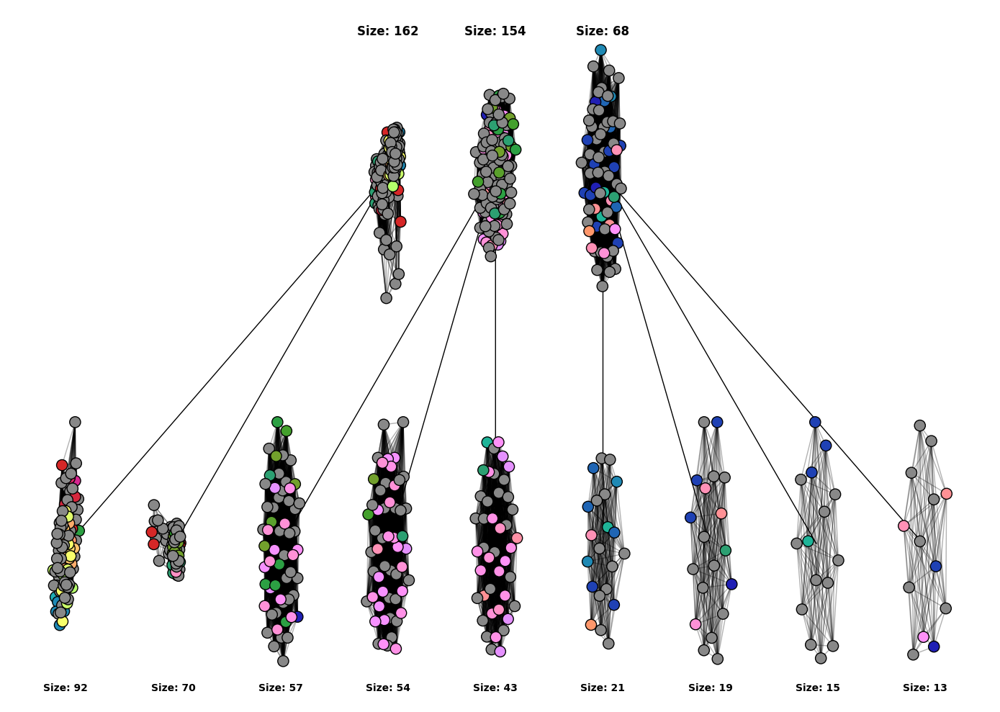

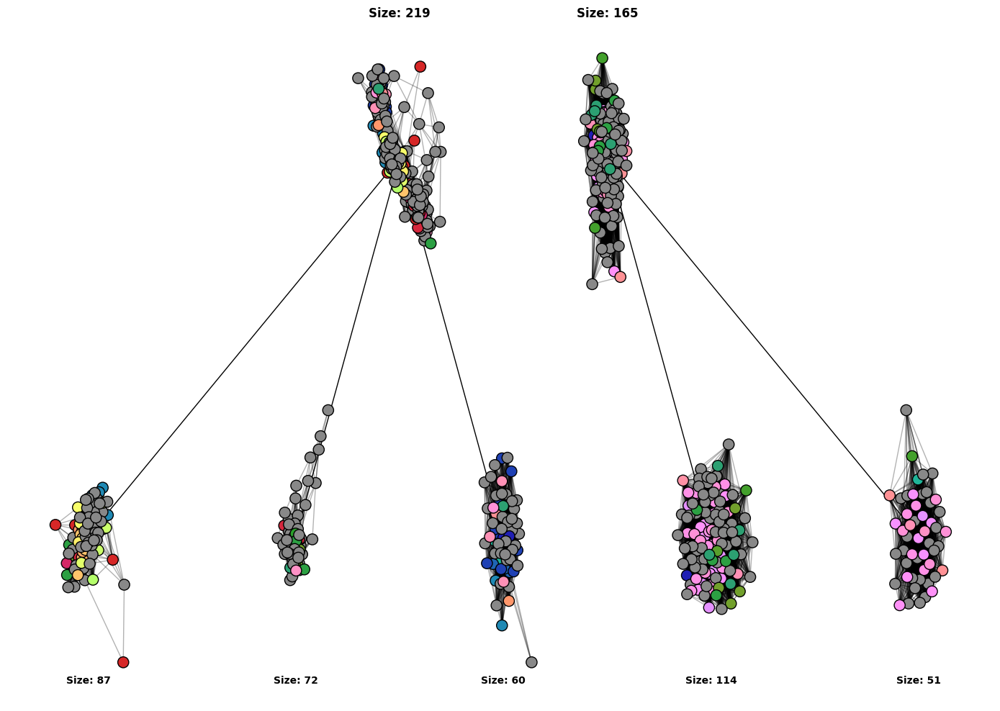

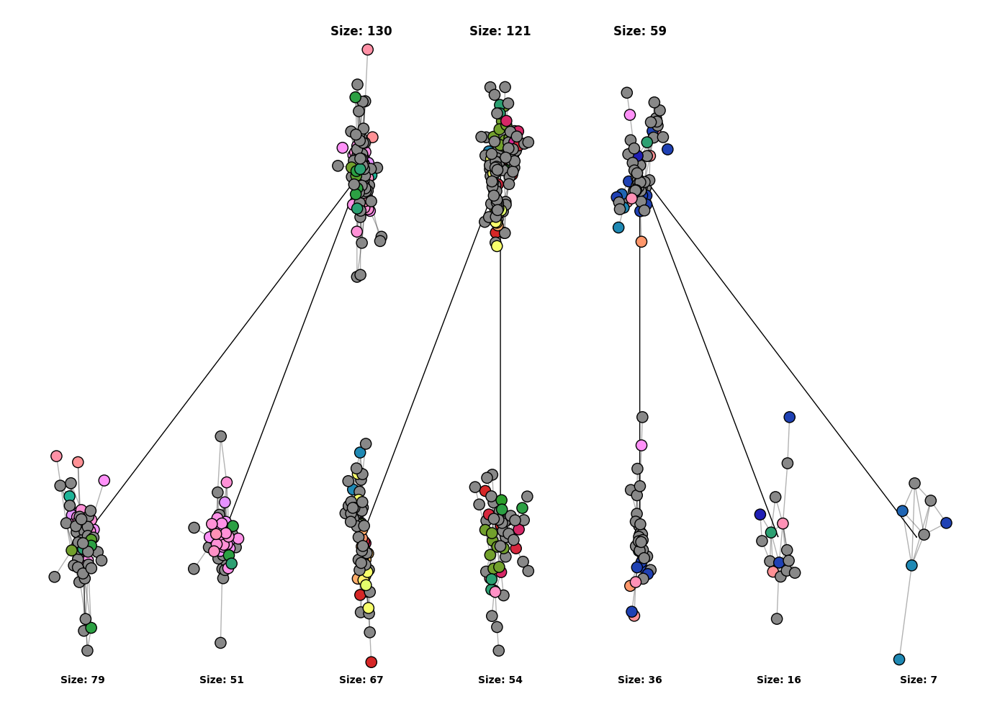

In [ ]:
paris_results_list = []

for delta, graph in modified_graphs.items():
	# Run top-level community detection
	top_level_paris = apply_paris(graph)

	# Evaluate Level 1 communities
	paris_eval_lvl1 = evaluate_level1_communities(delta, graph, top_level_paris)
	paris_results_list.append(paris_eval_lvl1)

	# Extract Level 2 subcommunities
	bottom_level_communities_paris, bottom_level_clustering_paris, bottom_to_top_map_paris = extract_second_level_communities(
			graph, algorithms.paris, top_level_paris, "Paris"
	)

	# Evaluate Level 2 subcommunities
	paris_eval_lvl2 = evaluate_level2_communities(delta, graph, bottom_level_clustering_paris)
	paris_results_list.append(paris_eval_lvl2)

	visualize_hierarchical_communities(
		graph,
		top_level_communities=top_level_paris.communities.copy(),
		bottom_level_communities=bottom_level_communities_paris,
		bottom_to_top_map=bottom_to_top_map_paris,
		color_map=level_2_colors,
		color_by="level_2",
		title="",
	)

# Combine all results into a single DataFrame

# Optional: Save to CSV
# output_path = "../results/cho-384/paris_hierarchical_results.csv"
# Paris_results_df.to_csv(output_path, index=False)

# Paris_results_df


In [53]:
Paris_results_df = format_results(pd.concat(paris_results_list, ignore_index=True))
Paris_results_df

,Level,Delta,Number of Communities,Nodes in Largest Community,Community Sizes,Singletons,Modularity,Closeness Centrality,ARI (L1),RI (L1),ARI (L2),RI (L2),Communities
0,L1,0.15,3,162,"[162, 154, 68]",0,0.368331,0.871379,0.362292,0.726583,NaN,NaN,"[[280, 204, 209, 203, 247, 257, 282, 323, 223,..."
1,L2,0.15,9,92,"[92, 70, 57, 54, 43, 21, 19, 15, 13]",0,0.230878,0.945145,NaN,NaN,0.103594,0.839357,"[[330, 381, 371, 336, 374, 372, 351, 353, 355,..."
2,L1,0.50,2,219,"[219, 165]",0,0.395946,0.619197,0.256313,0.624687,NaN,NaN,"[[277, 254, 258, 285, 311, 313, 358, 296, 328,..."
3,L2,0.50,5,114,"[114, 87, 72, 60, 51]",0,0.393697,0.814385,NaN,NaN,0.102876,0.777656,"[[115, 100, 154, 184, 192, 158, 170, 173, 166,..."
4,L1,0.85,3,130,"[130, 121, 59]",0,0.378158,0.357415,0.447936,0.761750,NaN,NaN,"[[229, 272, 92, 263, 193, 155, 154, 184, 116, ..."
5,L2,0.85,7,79,"[79, 67, 54, 51, 36, 16, 7]",0,0.436622,0.474504,NaN,NaN,0.130945,0.814894,"[[229, 272, 92, 263, 193, 155, 154, 184, 116, ..."


## LFM Algorithm

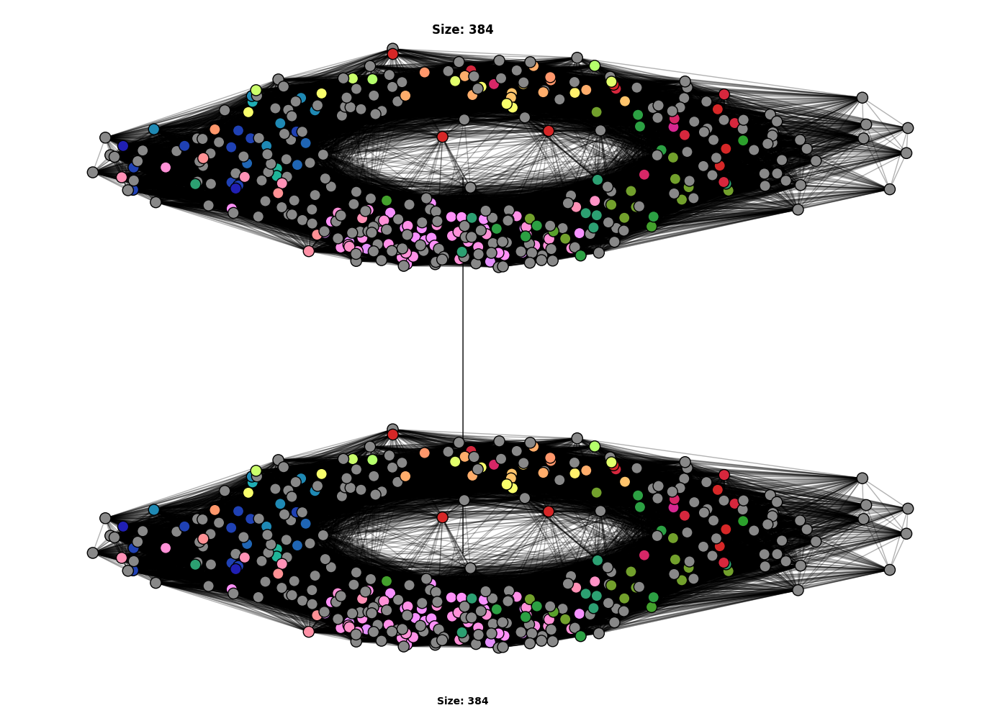

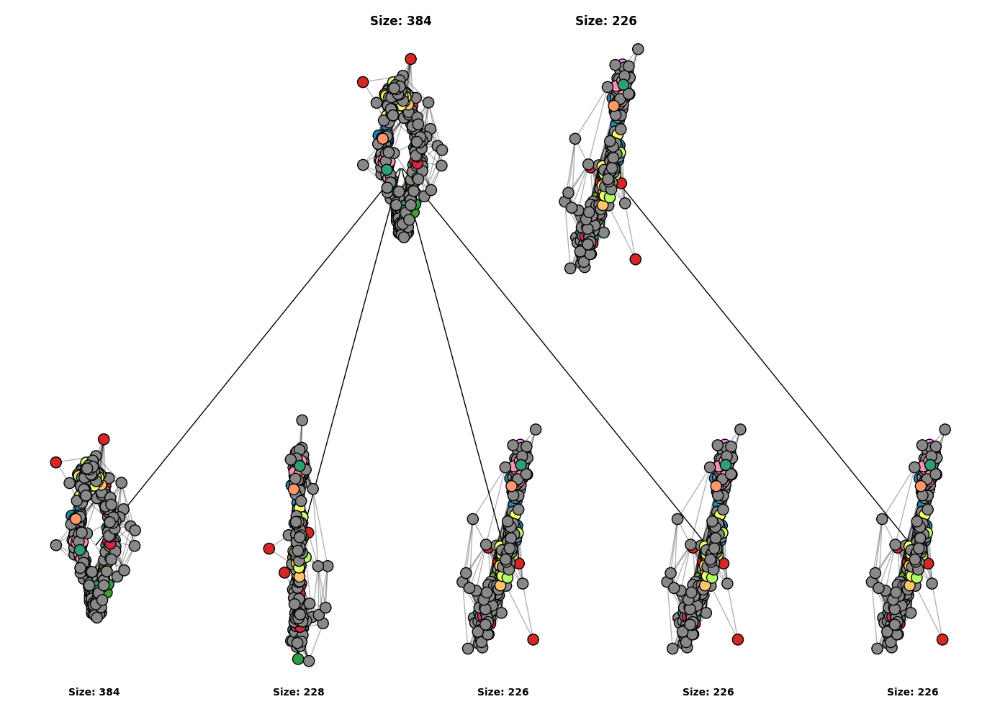

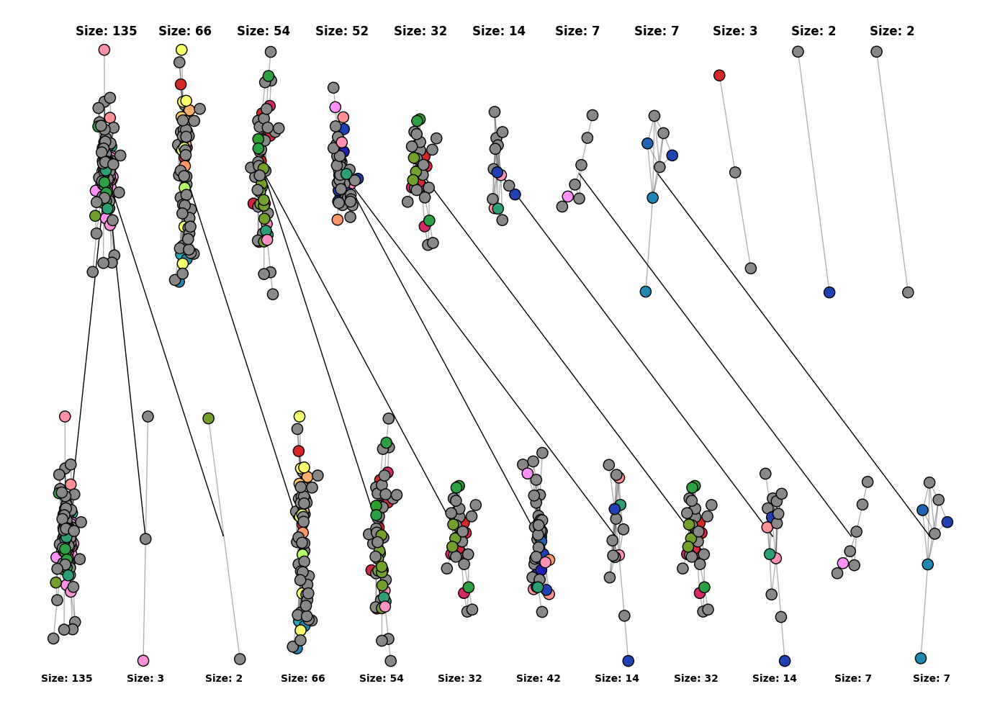

In [ ]:
random.seed(42)
np.random.seed(42)

# alpha_values = np.arange(0.1, 1.0, 0.1)
alpha_values = [0.75]
lfm_results_list = []
lfm_communities = []
for delta, graph in modified_graphs.items():
	for alpha in alpha_values:
		top_level_lfm = algorithms.lfm(graph, alpha=alpha)
		lfm_eval_lvl1 = evaluate_level1_communities(delta, graph, top_level_lfm)
		lfm_eval_lvl1.insert(2, "Alpha", alpha)
		lfm_results_list.append(lfm_eval_lvl1)

		# Extract Level 2 subcommunities
		bottom_level_communities_lfm, bottom_level_clustering_lfm, bottom_to_top_map_lfm = extract_second_level_communities(
			graph, algorithms.lfm, top_level_lfm, "LFM", alpha=alpha
		)
		
		# Evaluate Level 2 subcommunities
		lfm_eval_lvl2 = evaluate_level2_communities(delta, graph, bottom_level_clustering_lfm)
		lfm_eval_lvl2.insert(2, "Alpha", alpha)
		lfm_results_list.append(lfm_eval_lvl2)

		# Visualize hierarchical communities
		visualize_hierarchical_communities(
			graph,
			top_level_communities=top_level_lfm.communities.copy(),
			bottom_level_communities=bottom_level_communities_lfm,
			bottom_to_top_map=bottom_to_top_map_lfm,
			color_map=level_2_colors,
			color_by="level_2",
			title="",
		)

In [70]:
LFM_results_df = format_results(pd.concat(lfm_results_list, ignore_index=True))
LFM_results_df

,Level,Delta,Number of Communities,Nodes in Largest Community,Community Sizes,Singletons,Modularity,Closeness Centrality,ARI (L1),RI (L1),ARI (L2),RI (L2),Communities
0,L1,0.15,1,384,[384],0,5.107026e-15,0.625778,0.000000,0.229031,NaN,NaN,"[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
1,L2,0.15,1,384,[384],0,5.107026e-15,0.625778,NaN,NaN,0.000000,0.040599,"[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
2,L1,0.50,2,384,"[384, 226]",0,4.057900e-01,0.450738,0.238990,0.613550,NaN,NaN,"[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
3,L2,0.50,5,384,"[384, 228, 226, 226, 226]",0,4.055956e-01,0.449598,NaN,NaN,0.056771,0.538226,"[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
4,L1,0.85,11,135,"[135, 66, 54, 52, 32, 14, 7, 7, 3, 2, 2]",0,3.773027e-01,0.438602,0.554424,0.832780,NaN,NaN,"[[2, 11, 67, 68, 69, 70, 71, 72, 73, 74, 75, 7..."
5,L2,0.85,12,135,"[135, 66, 54, 42, 32, 32, 14, 14, 7, 7, 3, 2]",0,3.784420e-01,0.444611,NaN,NaN,0.154301,0.761803,"[[2, 11, 67, 68, 69, 70, 71, 72, 73, 74, 75, 7..."


## Girvan Newman Algorithm

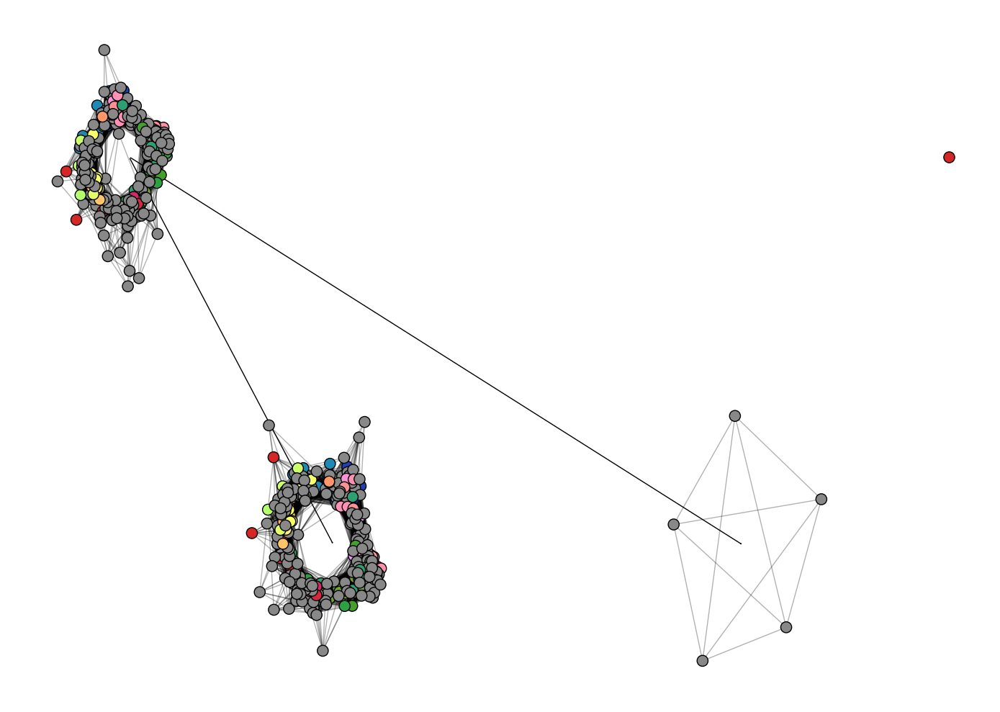

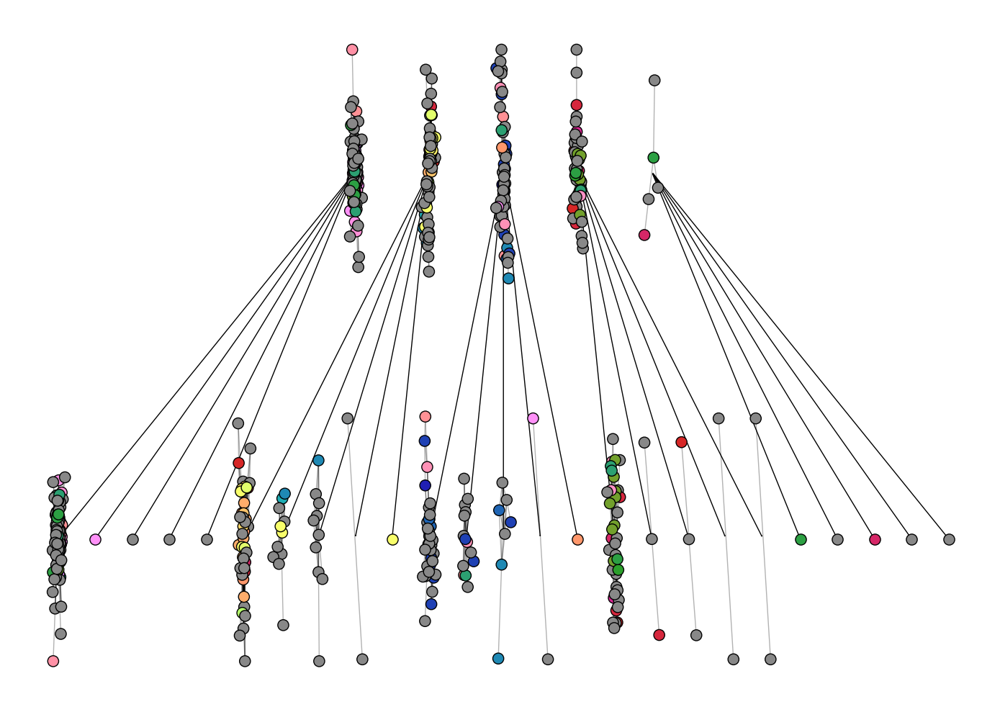

In [119]:
gn_results_list = []
for idx, (delta, graph) in enumerate({0.5:graphs[1], 0.85:G_lcc}.items()):
	# Set gn_level based on the index
	gn_level = 1 if idx < 1 else 4

	# Run top-level community detection using Girvan-Newman algorithm
	top_level_gn = algorithms.girvan_newman(graph, level=gn_level)
	gn_eval_lvl1 = evaluate_level1_communities(delta, graph, top_level_gn)
	gn_results_list.append(gn_eval_lvl1)

	# Extract Level 2 subcommunities
	bottom_level_communities_gn, bottom_level_clustering_gn, bottom_to_top_map_gn = extract_second_level_communities(
		graph, algorithms.girvan_newman, top_level_gn, "GN", level=gn_level
	)

	# Evaluate Level 2 subcommunities
	gn_eval_lvl2 = evaluate_level2_communities(delta, graph, bottom_level_clustering_gn)
	gn_results_list.append(gn_eval_lvl2)

	# Visualize hierarchical communities
	visualize_hierarchical_communities(
		graph,
		top_level_communities=top_level_gn.communities.copy(),
		bottom_level_communities=bottom_level_communities_gn,
		bottom_to_top_map=bottom_to_top_map_gn,
		color_map=level_2_colors,
		color_by="level_2",
		title="",
		top_spacing_x=10,
		show_text=False,
	)


In [149]:
# Girvan-Newman did not converge for delta = 0.15, so we need to fill in NaN values
missing_row_1 = generate_missing_row("Girvan-Newman", "L1", 0.15)
missing_row_2 = generate_missing_row("Girvan-Newman", "L2", 0.15)

GN_results_df = format_results(pd.concat(gn_results_list, ignore_index=True))
GN_results_df = pd.concat([missing_row_1, missing_row_2, GN_results_df], ignore_index=True)
GN_results_df

,Level,Delta,Number of Communities,Nodes in Largest Community,Community Sizes,Singletons,Modularity,Closeness Centrality,ARI (L1),RI (L1),ARI (L2),RI (L2),Communities
0,L1,0.15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,L2,0.15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,L1,0.50,2.0,383.0,"[383, 1]",1.0,-4.288705e-09,0.452950,0.001300,0.232852,NaN,NaN,"[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
3,L2,0.50,2.0,378.0,"[378, 5]",0.0,2.125673e-04,0.463337,NaN,NaN,0.000416,0.052063,"[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
4,L1,0.85,5.0,131.0,"[131, 65, 59, 50, 5]",0.0,3.850967e-01,0.429047,0.557334,0.826495,NaN,NaN,"[[2, 11, 67, 68, 69, 70, 71, 72, 73, 74, 75, 7..."
5,L2,0.85,25.0,127.0,"[127, 41, 40, 35, 14, 11, 10, 7, 3, 3, 2, 2, 2...",11.0,3.732746e-01,0.540417,NaN,NaN,0.165002,0.766667,"[[2, 11, 67, 68, 69, 70, 71, 72, 73, 74, 75, 7..."


# Dynamic Community Detection
Using our formed network, we employ the Infomap and TILES algorithms.

## Infomap Algorithm

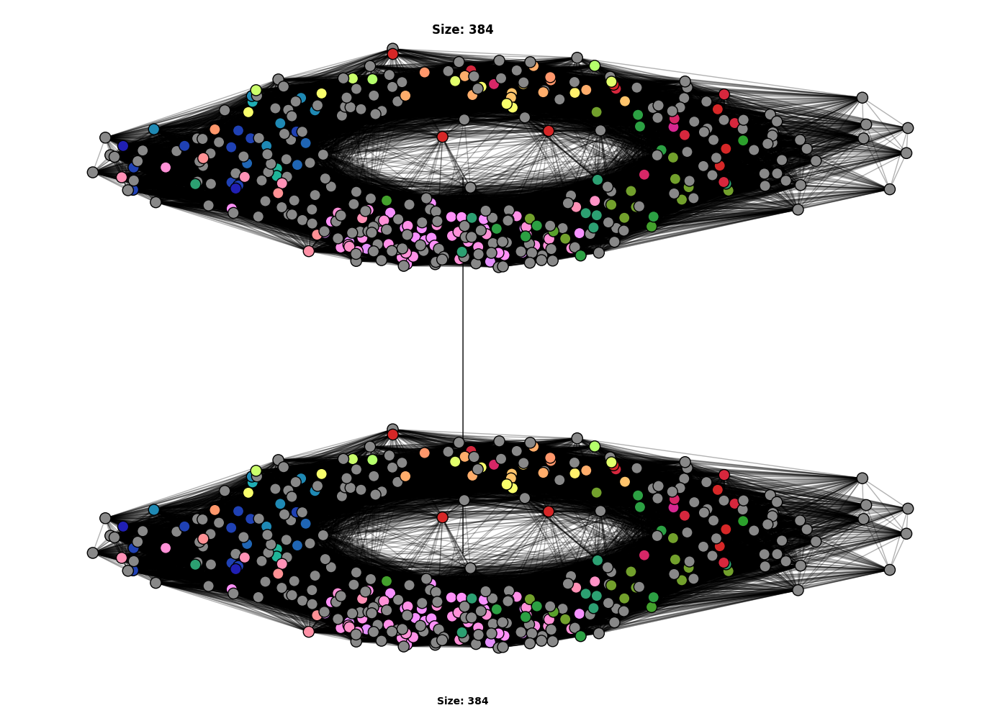

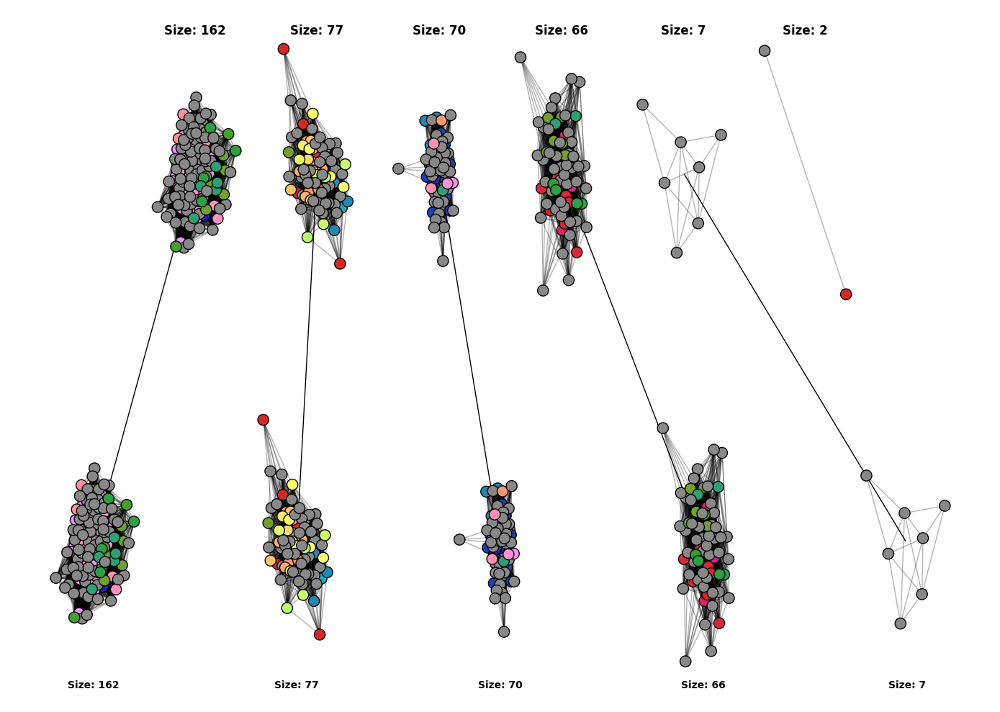

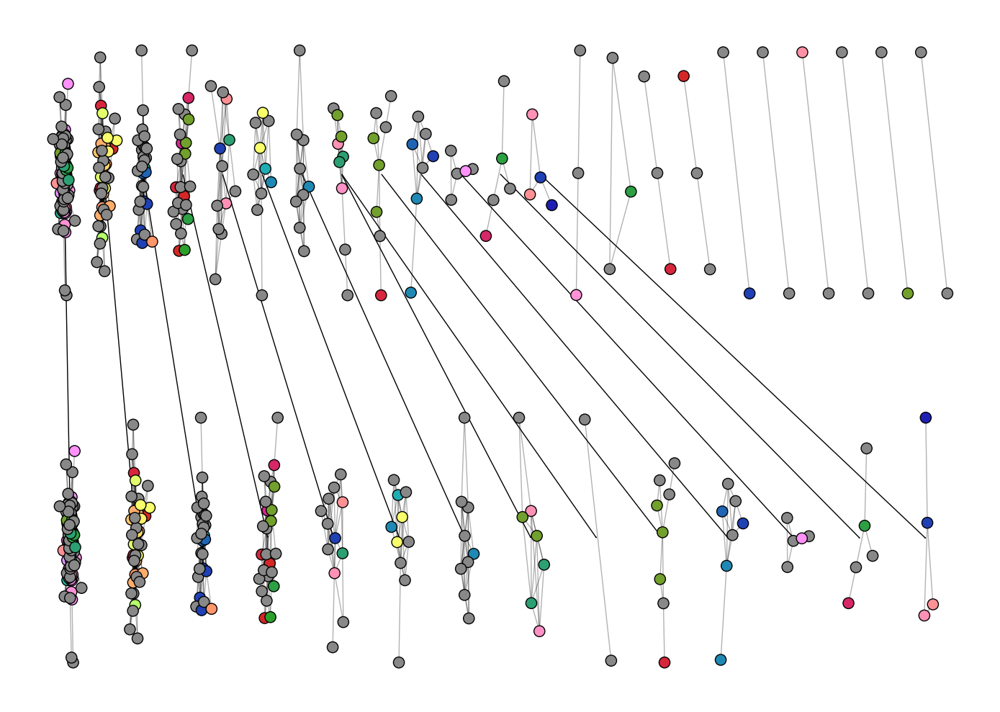

In [123]:
infomap_results_list = []

for idx, (delta, graph) in enumerate(modified_graphs.items()):
	
	top_level_infomap = algorithms.infomap(graph)
	infomap_eval_lvl1 = evaluate_level1_communities(delta, graph, top_level_infomap)
	infomap_results_list.append(infomap_eval_lvl1)


	bottom_level_communities_infomap, bottom_level_clustering_infomap, bottom_to_top_map_infomap = extract_second_level_communities(graph, algorithms.infomap, top_level_infomap, "Infomap")
	infomap_eval_lvl2 = evaluate_level2_communities(delta, graph, bottom_level_clustering_infomap)
	infomap_results_list.append(infomap_eval_lvl2)

	top_level_communities_infomap = top_level_infomap.communities.copy()
	visualize_hierarchical_communities(
			graph, 
			top_level_communities=top_level_communities_infomap, 
			bottom_level_communities=bottom_level_communities_infomap, 
			bottom_to_top_map=bottom_to_top_map_infomap, 
			color_map=level_2_colors, 
			color_by="level_2", 
			title="",
			top_spacing_x=3,
			show_text= idx != 2,
		)



In [124]:
Infomap_results_df = format_results(pd.concat(infomap_results_list, ignore_index=True))
Infomap_results_df

,Level,Delta,Number of Communities,Nodes in Largest Community,Community Sizes,Singletons,Modularity,Closeness Centrality,ARI (L1),RI (L1),ARI (L2),RI (L2),Communities
0,L1,0.15,1,384,[384],0,5.107026e-15,0.625778,0.000000,0.229031,NaN,NaN,"[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
1,L2,0.15,1,384,[384],0,5.107026e-15,0.625778,NaN,NaN,0.000000,0.040599,"[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
2,L1,0.50,6,162,"[162, 77, 70, 66, 7, 2]",0,4.477479e-01,0.819313,0.483993,0.803674,NaN,NaN,"[[2, 11, 29, 32, 63, 67, 68, 69, 70, 71, 72, 7..."
3,L2,0.50,5,162,"[162, 77, 70, 66, 7]",0,4.428314e-01,0.818367,NaN,NaN,0.109437,0.705732,"[[2, 11, 29, 32, 63, 67, 68, 69, 70, 71, 72, 7..."
4,L1,0.85,23,122,"[122, 42, 29, 24, 12, 10, 9, 9, 8, 7, 5, 5, 4,...",0,3.704258e-01,0.593999,0.519018,0.833156,NaN,NaN,"[[2, 11, 67, 68, 69, 70, 71, 72, 73, 74, 75, 7..."
5,L2,0.85,14,122,"[122, 42, 29, 24, 12, 10, 9, 8, 7, 7, 5, 5, 4, 2]",0,3.207645e-01,0.574996,NaN,NaN,0.156528,0.783992,"[[2, 11, 67, 68, 69, 70, 71, 72, 73, 74, 75, 7..."


## Walktrap Algorithm

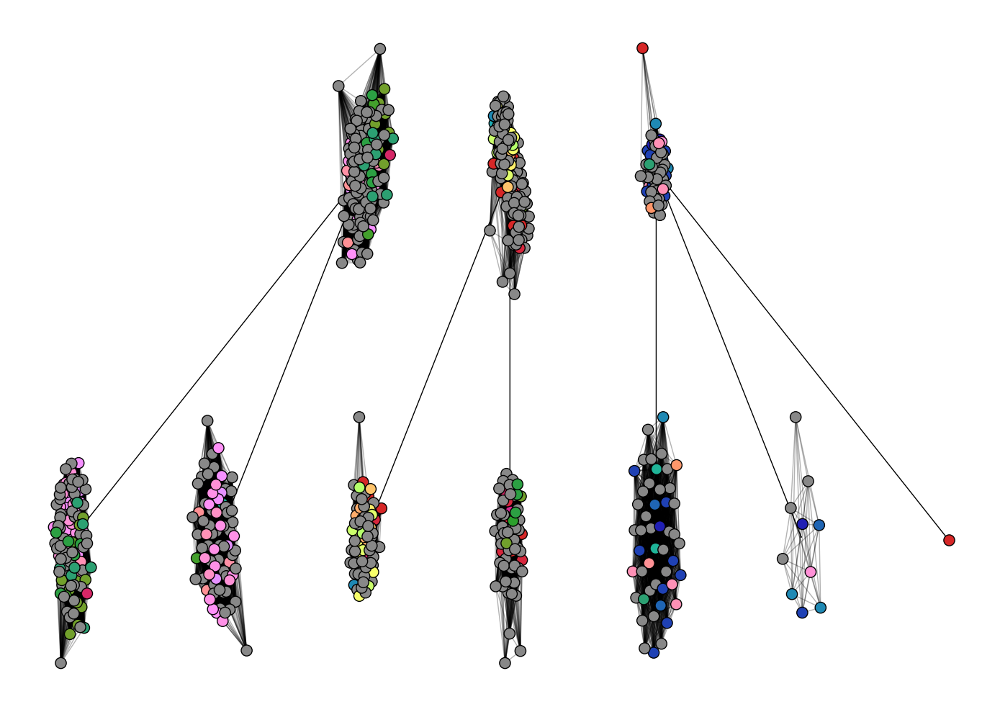

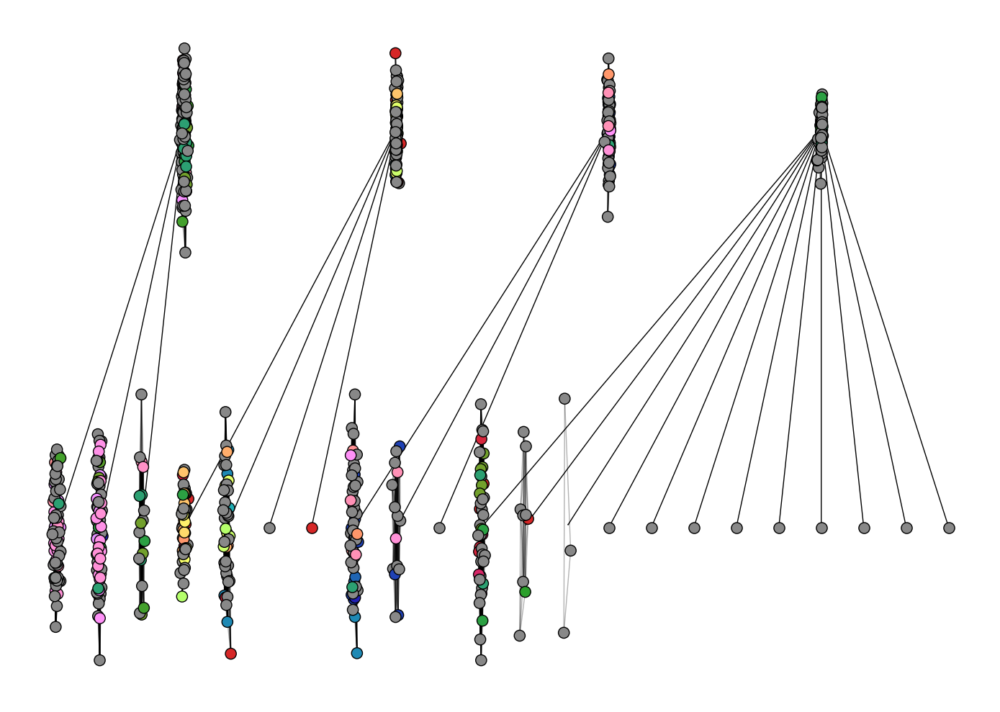

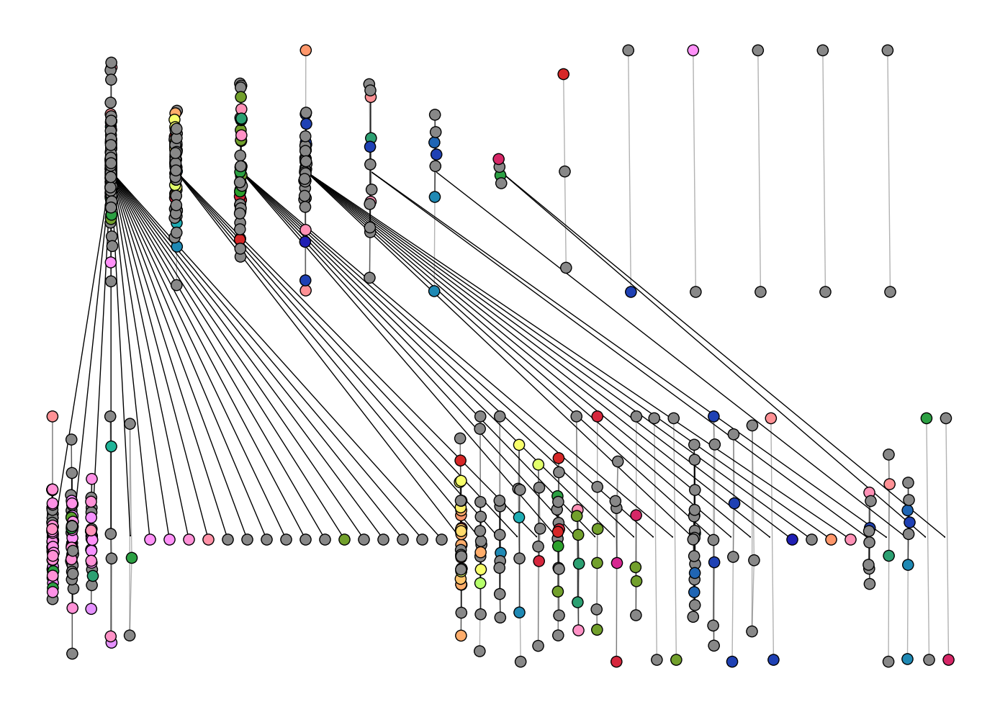

In [125]:
walktrap_results_list = []

for idx, (delta, graph) in enumerate(modified_graphs.items()):
	top_level_walktrap = algorithms.walktrap(graph)
	walktrap_eval_lvl1 = evaluate_level1_communities(delta, graph, top_level_walktrap)
	walktrap_results_list.append(walktrap_eval_lvl1)
	
	bottom_level_communities_walktrap, bottom_level_clustering_walktrap, bottom_to_top_map_walktrap = extract_second_level_communities(graph, algorithms.walktrap, top_level_walktrap, "Walktrap")
	walktrap_eval_lvl2 = evaluate_level2_communities(delta, graph, bottom_level_clustering_walktrap)
	walktrap_results_list.append(walktrap_eval_lvl2)

	top_level_communities_walktrap = top_level_walktrap.communities.copy()
	
	if idx == 0:
		figure_size = (14, 10)
		top_spacing_x = 5
		bottom_spacing_x = 5
	elif idx == 1:
		figure_size = (20, 10)
		top_spacing_x = 50
		bottom_spacing_x = 10
	else:
		figure_size = (40, 10)
		top_spacing_x = 50
		bottom_spacing_x = 15
	visualize_hierarchical_communities(
			graph, 
			top_level_communities=top_level_communities_walktrap, 
			bottom_level_communities=bottom_level_communities_walktrap, 
			bottom_to_top_map=bottom_to_top_map_walktrap, 
			color_map=level_2_colors, 
			color_by="level_2",
			# figure_size=figure_size, 
			top_spacing_x=top_spacing_x,
			bottom_spacing_x=bottom_spacing_x,
			show_text=False,
		)

# walktrap_communities = algorithms.walktrap(G_lcc)

# Walktrap_results = evaluate_community(G_lcc, walktrap_communities)
# Walktrap_results

In [126]:
Walktrap_results_df = format_results(pd.concat(walktrap_results_list, ignore_index=True))
Walktrap_results_df

,Level,Delta,Number of Communities,Nodes in Largest Community,Community Sizes,Singletons,Modularity,Closeness Centrality,ARI (L1),RI (L1),ARI (L2),RI (L2),Communities
0,L1,0.15,3,189,"[189, 136, 59]",0,0.352893,0.870460,0.396306,0.734239,NaN,NaN,"[[2, 11, 29, 30, 32, 47, 61, 62, 63, 64, 67, 6..."
1,L2,0.15,7,114,"[114, 77, 75, 59, 48, 10, 1]",1,0.279603,0.966249,NaN,NaN,0.106325,0.777072,"[[11, 29, 32, 70, 71, 72, 73, 74, 75, 76, 77, ..."
2,L1,0.50,4,163,"[163, 89, 68, 64]",0,0.446579,0.793441,0.465559,0.793258,NaN,NaN,"[[2, 11, 29, 32, 63, 67, 68, 69, 70, 71, 72, 7..."
3,L2,0.50,22,78,"[78, 67, 52, 44, 43, 43, 18, 15, 9, 3, 1, 1, 1...",12,0.291314,0.910324,NaN,NaN,0.114211,0.847024,"[[2, 63, 67, 68, 69, 72, 74, 76, 77, 80, 81, 8..."
4,L1,0.85,13,132,"[132, 64, 42, 36, 12, 7, 4, 3, 2, 2, 2, 2, 2]",0,0.382081,0.497440,0.538015,0.825097,NaN,NaN,"[[2, 11, 67, 68, 69, 70, 71, 72, 73, 74, 75, 7..."
5,L2,0.85,47,46,"[46, 40, 29, 21, 17, 15, 13, 9, 8, 7, 7, 7, 6,...",20,0.326122,0.717879,NaN,NaN,0.157920,0.896251,"[[67, 68, 73, 74, 75, 77, 78, 79, 87, 92, 94, ..."


## Spinglass Algorithm

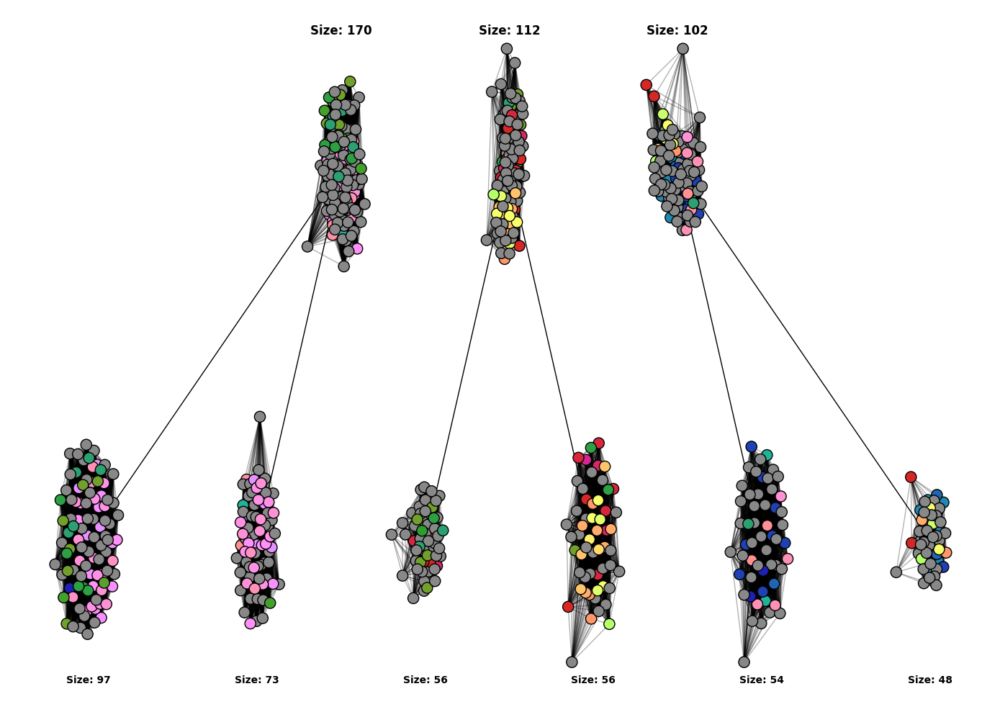

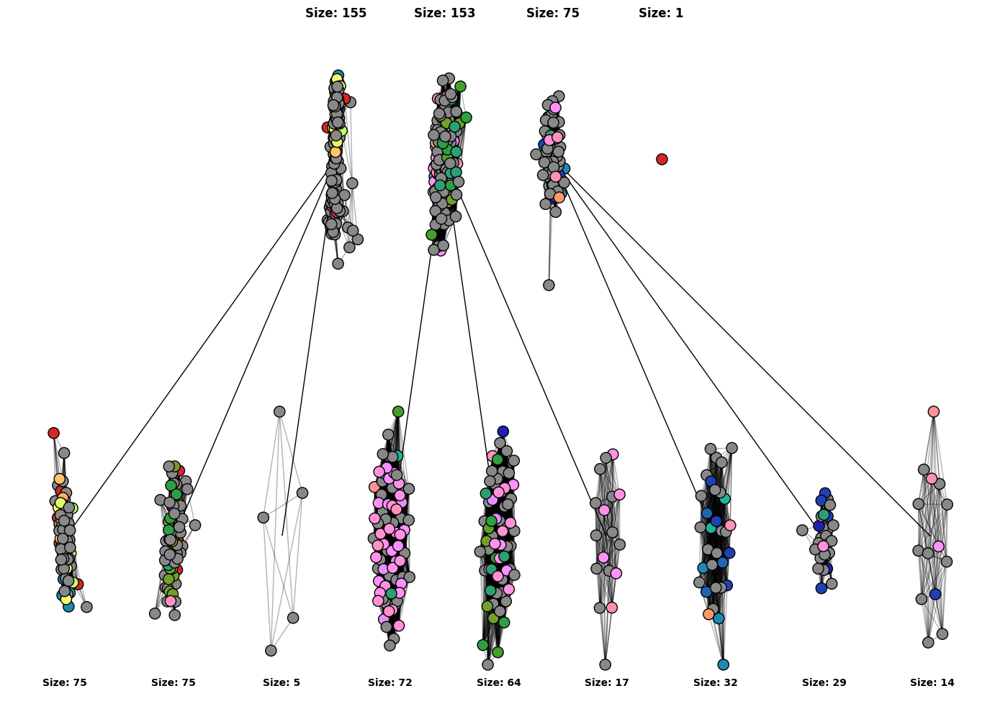

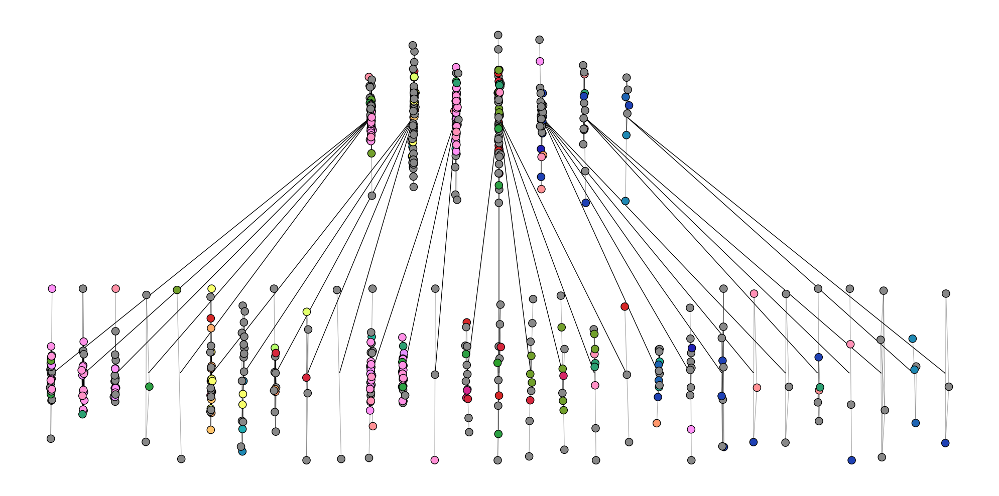

In [127]:
spinglass_results_list = []

for idx, (delta, graph) in enumerate(modified_graphs.items()):
	top_level_spinglass = algorithms.spinglass(graph)
	spinglass_eval_lvl1 = evaluate_level1_communities(delta, graph, top_level_spinglass)
	spinglass_results_list.append(spinglass_eval_lvl1)

	bottom_level_communities_spinglass, bottom_level_clustering_spinglass, bottom_to_top_map_spinglass = extract_second_level_communities(graph, algorithms.spinglass, top_level_spinglass, "Spinglass")
	spinglass_eval_lvl2 = evaluate_level2_communities(delta, graph, bottom_level_clustering_spinglass)
	spinglass_results_list.append(spinglass_eval_lvl2)
	
	top_level_communities_spinglass = top_level_spinglass.communities.copy()
	if idx < 2:
		figure_size = (14, 10)
		top_spacing_x = 5
		bottom_spacing_x = 5
		show_text = True
	else:
		figure_size = (20, 10)
		top_spacing_x = 20
		bottom_spacing_x = 15
		show_text = False
	visualize_hierarchical_communities(
			graph, 
			top_level_communities=top_level_communities_spinglass, 
			bottom_level_communities=bottom_level_communities_spinglass, 
			bottom_to_top_map=bottom_to_top_map_spinglass, 
			color_map=level_2_colors, 
			color_by="level_2", 
			figure_size=figure_size,
			top_spacing_x=top_spacing_x,
			bottom_spacing_x=bottom_spacing_x,
			show_text=show_text,
			title="",
		)


In [128]:
Spinglass_results_df = format_results(pd.concat(spinglass_results_list, ignore_index=True))
Spinglass_results_df

,Level,Delta,Number of Communities,Nodes in Largest Community,Community Sizes,Singletons,Modularity,Closeness Centrality,ARI (L1),RI (L1),ARI (L2),RI (L2),Communities
0,L1,0.15,3,170,"[170, 112, 102]",0,0.376864,0.898891,0.431257,0.761885,NaN,NaN,"[[2, 11, 29, 30, 32, 63, 67, 68, 69, 70, 71, 7..."
1,L2,0.15,6,97,"[97, 73, 56, 56, 54, 48]",0,0.255986,0.975481,NaN,NaN,0.110784,0.804016,"[[11, 29, 32, 71, 72, 73, 74, 75, 76, 77, 78, ..."
2,L1,0.50,4,155,"[155, 153, 75, 1]",1,0.448848,0.725388,0.375747,0.735857,NaN,NaN,"[[3, 6, 8, 9, 30, 31, 41, 42, 44, 55, 58, 66, ..."
3,L2,0.50,9,75,"[75, 75, 72, 64, 32, 29, 17, 14, 5]",0,0.323955,0.875379,NaN,NaN,0.125435,0.830011,"[[3, 6, 8, 9, 31, 41, 42, 44, 55, 58, 66, 267,..."
4,L1,0.85,7,68,"[68, 65, 62, 56, 38, 14, 7]",0,0.451355,0.480333,0.374110,0.786763,NaN,NaN,"[[11, 67, 68, 70, 71, 77, 82, 84, 85, 87, 90, ..."
5,L2,0.85,29,32,"[32, 27, 27, 25, 19, 19, 19, 14, 12, 12, 11, 1...",0,0.334529,0.676831,NaN,NaN,0.114182,0.909828,"[[2, 131, 135, 145, 148, 149, 276, 151, 152, 1..."


# Community Detection Results

In [150]:
Paris_results_df["Algorithm"] = "Paris"
LFM_results_df["Algorithm"] = "LFM"
GN_results_df["Algorithm"] = "Girvan-Newman"
Infomap_results_df["Algorithm"] = "Infomap"
Walktrap_results_df["Algorithm"] = "Walktrap"
Spinglass_results_df["Algorithm"] = "Spinglass"

# Combine all into one
Community_Detection_Results = pd.concat([
    Paris_results_df,
    LFM_results_df,
    GN_results_df,
    Infomap_results_df,
    Walktrap_results_df,
    Spinglass_results_df
], axis=0)

# Reorder so "Algorithm" is the first column and "Communities" is last
columns_order = [col for col in Community_Detection_Results.columns if col not in ["Algorithm", "Communities"]]
columns_order = ["Algorithm"] + columns_order + ["Communities"]
Community_Detection_Results = Community_Detection_Results[columns_order]


# Save separate CSVs per Delta
output_dir = "../results/cho-384/community_detection_results_by_delta"
os.makedirs(output_dir, exist_ok=True)

# Group by Delta and save each one
for delta_value, group_df in Community_Detection_Results.groupby("Delta"):
    delta_filename = f"{output_dir}/cho-384_cd_results_delta_{delta_value:.2f}.csv"
    group_df.to_csv(delta_filename, index=False)

Community_Detection_Results


,Algorithm,Level,Delta,Number of Communities,Nodes in Largest Community,Community Sizes,Singletons,Modularity,Closeness Centrality,ARI (L1),RI (L1),ARI (L2),RI (L2),Communities
0,Paris,L1,0.15,3.0,162.0,"[162, 154, 68]",0.0,3.683312e-01,0.871379,0.362292,0.726583,NaN,NaN,"[[280, 204, 209, 203, 247, 257, 282, 323, 223,..."
1,Paris,L2,0.15,9.0,92.0,"[92, 70, 57, 54, 43, 21, 19, 15, 13]",0.0,2.308780e-01,0.945145,NaN,NaN,0.103594,0.839357,"[[330, 381, 371, 336, 374, 372, 351, 353, 355,..."
2,Paris,L1,0.50,2.0,219.0,"[219, 165]",0.0,3.959463e-01,0.619197,0.256313,0.624687,NaN,NaN,"[[277, 254, 258, 285, 311, 313, 358, 296, 328,..."
3,Paris,L2,0.50,5.0,114.0,"[114, 87, 72, 60, 51]",0.0,3.936966e-01,0.814385,NaN,NaN,0.102876,0.777656,"[[115, 100, 154, 184, 192, 158, 170, 173, 166,..."
4,Paris,L1,0.85,3.0,130.0,"[130, 121, 59]",0.0,3.781582e-01,0.357415,0.447936,0.761750,NaN,NaN,"[[229, 272, 92, 263, 193, 155, 154, 184, 116, ..."
5,Paris,L2,0.85,7.0,79.0,"[79, 67, 54, 51, 36, 16, 7]",0.0,4.366223e-01,0.474504,NaN,NaN,0.130945,0.814894,"[[229, 272, 92, 263, 193, 155, 154, 184, 116, ..."
0,LFM,L1,0.15,1.0,384.0,[384],0.0,5.107026e-15,0.625778,0.000000,0.229031,NaN,NaN,"[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
1,LFM,L2,0.15,1.0,384.0,[384],0.0,5.107026e-15,0.625778,NaN,NaN,0.000000,0.040599,"[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
2,LFM,L1,0.50,2.0,384.0,"[384, 226]",0.0,4.057900e-01,0.450738,0.238990,0.613550,NaN,NaN,"[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."
3,LFM,L2,0.50,5.0,384.0,"[384, 228, 226, 226, 226]",0.0,4.055956e-01,0.449598,NaN,NaN,0.056771,0.538226,"[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13..."


# Results Visualization

In [151]:
# Prepare a function to generate bar plots for ARI (L1) and RI (L1) or ARI (L2) and RI (L2)
def plot_metric_by_delta(results_df, metrics, level_title_suffix):
    unique_deltas = sorted(results_df["Delta"].dropna().unique())
    for delta in unique_deltas:
        subset_df = results_df[(results_df["Delta"] == delta) & (results_df["Level"] == level_title_suffix)]
        
        if subset_df.empty:
            continue

        labels = subset_df["Algorithm"]
        x = np.arange(len(labels))
        width = 0.2

        fig, ax = plt.subplots(figsize=(10, 6))
        offsets = np.linspace(-0.5, 0.5, num=len(metrics))

        for metric, offset in zip(metrics, offsets):
            if metric not in subset_df.columns:
                continue
            values = subset_df[metric]
            bars = ax.bar(x + offset * width, values, width, label=metric)
            ax.bar_label(bars, fmt='%.3f', padding=3, fontsize=8)

        ax.set_ylabel('Score')
        ax.set_title(f"{' and '.join(metrics)} for Cho-384 Network (delta = {delta}, Level = {level_title_suffix})")
        ax.set_xticks(x)
        ax.set_xticklabels(labels, rotation=15)
        ax.set_ylim(0, 1)
        ax.legend()
        plt.tight_layout()
        plt.grid(axis='y', linestyle='--', alpha=0.6)
        plt.show()

## Level 1 Classifications Score

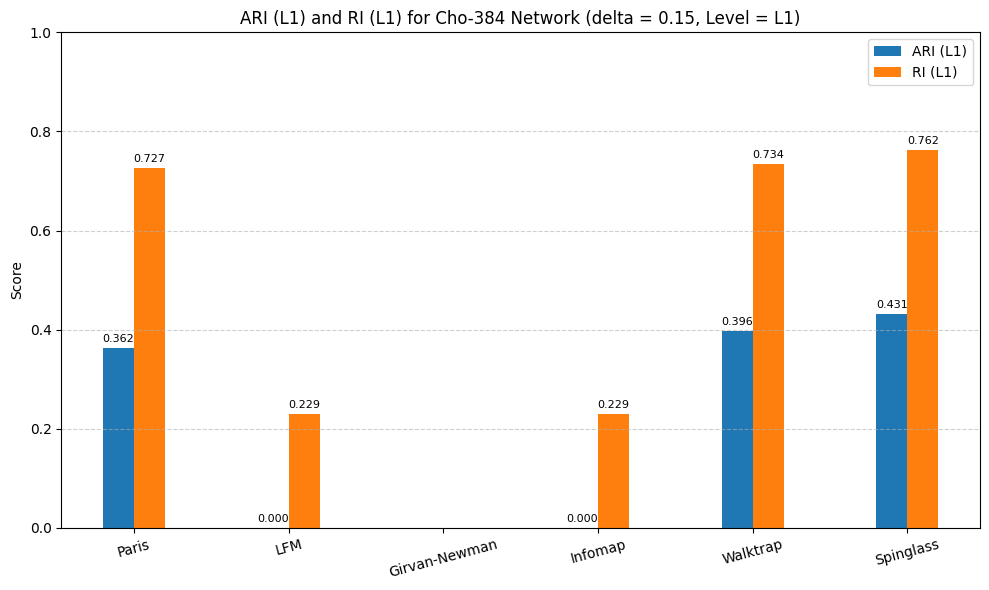

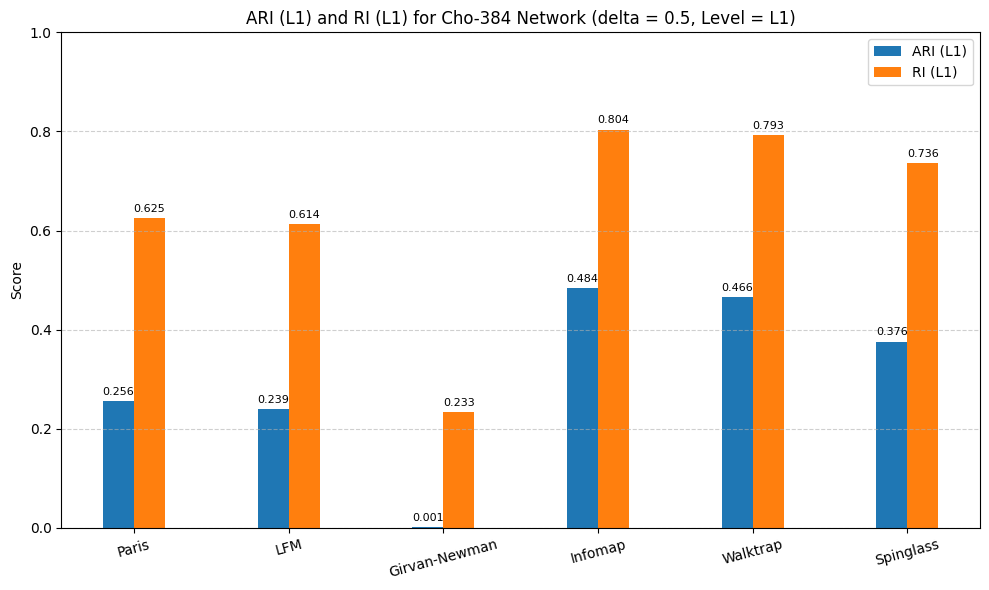

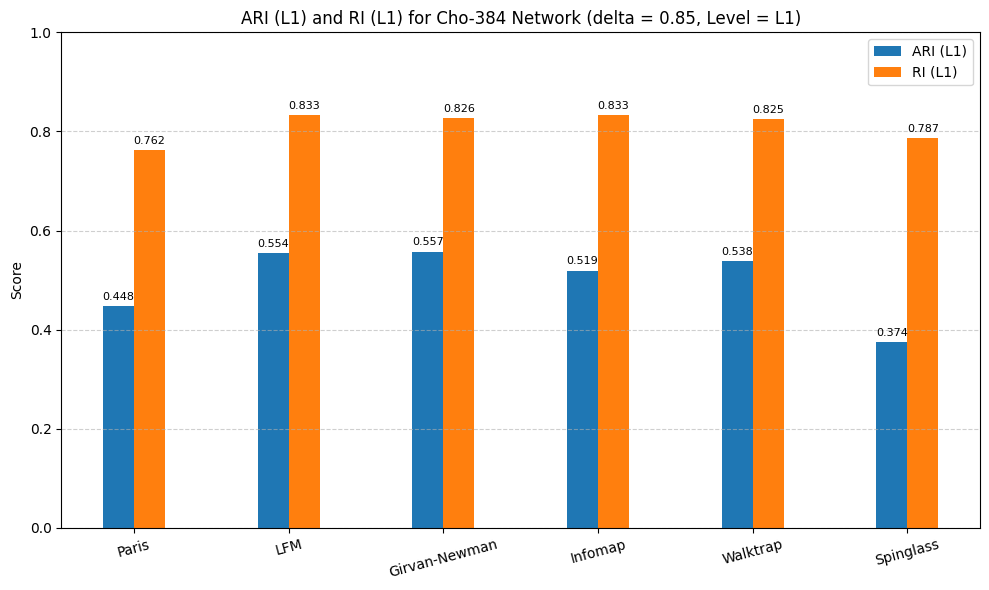

In [152]:

# Plot ARI and RI for Level 1
plot_metric_by_delta(Community_Detection_Results, metrics=["ARI (L1)", "RI (L1)"], level_title_suffix="L1")

## Level 2 Classifications Score

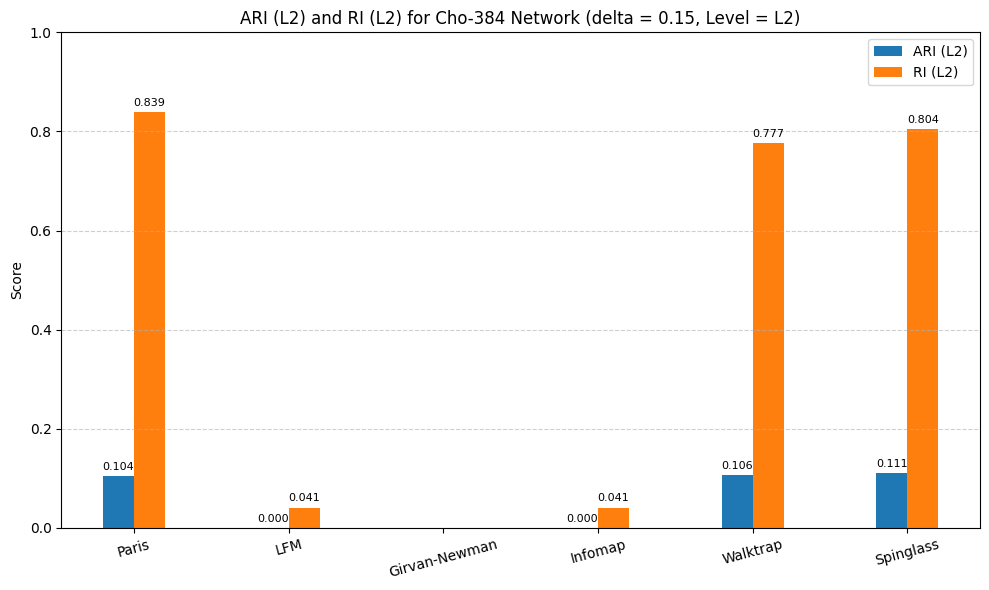

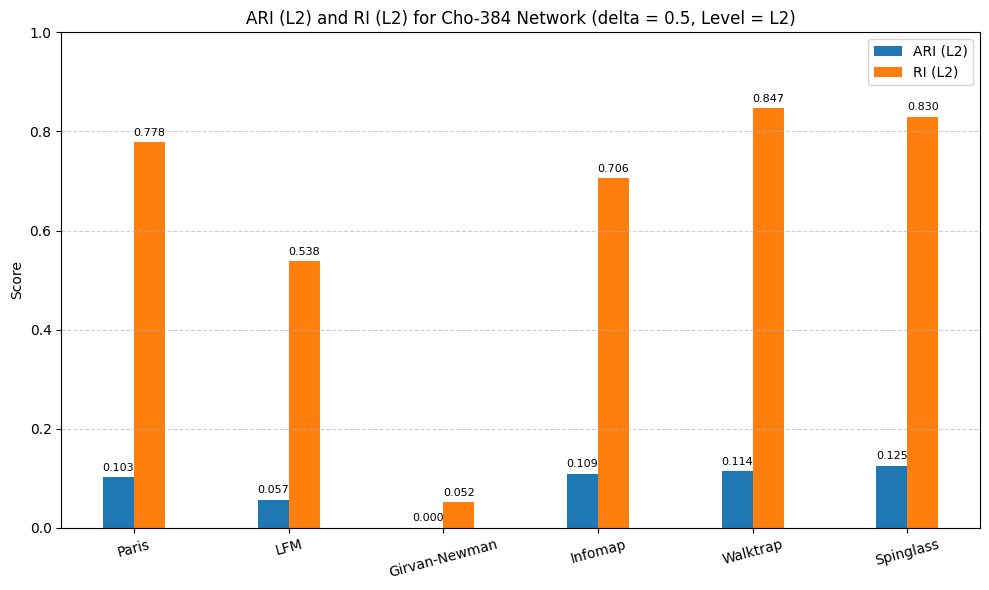

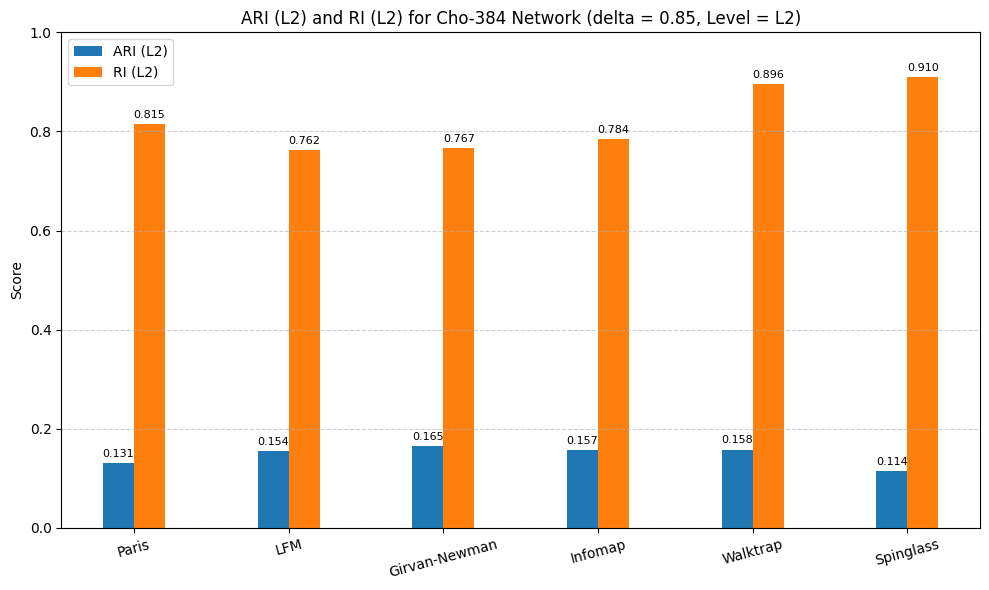

In [153]:
# Plot ARI and RI for Level 2
plot_metric_by_delta(Community_Detection_Results, metrics=["ARI (L2)", "RI (L2)"], level_title_suffix="L2")